In [1]:
# core
import sys
import time
from datetime import timedelta

# internal
sys.path.append('../code/poloniex')
sys.path.append('../code')
import polo_eda as pe
import calc_TA_sigs as cts
import data_processing as dp

# installed
import tensorflow as tf
import pandas as pd
import numpy as np

# plotting
import matplotlib.pyplot as plt
%matplotlib inline
import plotly
plotly.offline.init_notebook_mode()
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
from plotly.graph_objs import Scatter, Figure, Layout, Candlestick
from plotly.tools import FigureFactory as FF
import plotly.graph_objs as go

In [2]:
df = pe.read_trade_hist('BTC_AMP')

In [3]:
rs = dp.resample_ohlc(df)

In [4]:
sc_df, scalers = dp.transform_data(rs)

In [9]:
start = time.time()
feats, targs = dp.create_hist_feats(sc_df.iloc[-10000:])
end = time.time()
print('took', str(int(end - start)), 'seconds')

took 5 seconds


In [10]:
targs.shape

(9695, 1)

In [11]:
feats.shape

(9695, 300, 5)

In [12]:
train_feats = feats[:-1000]
train_targs = targs[:-1000]

In [13]:
def data_input(feats):
    """
    Return a Tensor for a batch of data input
    :param feat: a single feature from the features array
    :returns: Tensor placeholder for image input.
    """
    return tf.placeholder(tf.float32, [None, *feats.shape[1:]], name='input')


def data_target():
    """
    Return a Tensor for output
    :returns: Tensor for label input.
    """
    # DONE: Implement Function
    return tf.placeholder(tf.float32, shape=(None, 1), name='target')


def keep_prob_input():
    """
    Return a Tensor for keep probability
    : return: Tensor for keep probability.
    """
    # DONE: Implement Function
    keep_prob = tf.placeholder(tf.float32, name='keep_prob')
    return keep_prob

In [14]:
def fully_conn(x_tensor, num_outputs):
    """
    Apply a fully connected layer to x_tensor using weight and bias
    : x_tensor: A 2-D tensor where the first dimension is batch size.
    : num_outputs: The number of output that the new tensor should be.
    : return: A 2-D tensor where the second dimension is num_outputs.
    """
    return tf.contrib.layers.fully_connected(x_tensor, num_outputs)

In [15]:
def make_batches(feats, targs, batchsize=32):
    f_batches = []
    t_batches = []
    num_batches = int(targs.shape[0] / batchsize)
    print('num_batches:', num_batches)
    print('leftovers:', targs.shape[0] - batchsize*num_batches)
    for i in range(num_batches):
        start_idx = i * batchsize
        end_idx = start_idx + batchsize
        f_batches.append(feats[start_idx:end_idx])
        t_batches.append(targs[start_idx:end_idx])
    
    print(i)
    f_batches.append(feats[end_idx:])
    t_batches.append(targs[end_idx:])
    f_batches = np.array(f_batches)
    t_batches = np.array(t_batches)
    
    return f_batches, t_batches

In [16]:
def simple_net(x, keep_prob):
    flat = tf.contrib.layers.flatten(x)
    fc1 = fully_conn(flat, 500)
    drop1 = tf.nn.dropout(fc1, keep_prob)
    out = tf.layers.dense(drop1, 1)  # need a linear activation on the output to work
    return out

In [17]:
# hyperparameters
epochs = 15
batch_size = 32
keep_probability = 0.5

In [18]:
# Remove previous weights, bias, inputs, etc..
tf.reset_default_graph()

# Inputs
x = data_input(feats)
y = data_target()
keep_prob = keep_prob_input()

# Model
pred = simple_net(x, keep_prob)

# Name predictions Tensor, so that is can be loaded from disk after training
pred = tf.identity(pred, name='predictions')

# Loss and Optimizer
mse = tf.losses.mean_squared_error(pred, y)
loss = tf.reduce_mean(mse, name='mse_mean')
tf.summary.scalar('loss', loss)
optimizer = tf.train.AdamOptimizer().minimize(loss)

In [19]:
def train_neural_network(session, optimizer, keep_probability, feature_batch, label_batch):
    """
    Optimize the session on a batch of images and labels
    : session: Current TensorFlow session
    : optimizer: TensorFlow optimizer function
    : keep_probability: keep probability
    : feature_batch: Batch of Numpy image data
    : label_batch: Batch of Numpy label data
    """
    # DONE: Implement Function
    # tf.initialize_all_variables() 
    session.run(optimizer, 
                feed_dict={x: feature_batch, y: label_batch, keep_prob: keep_probability})

In [20]:
def print_stats(session, feature_batch, label_batch, mse):
    """
    Print information about loss and validation accuracy
    : session: Current TensorFlow session
    : feature_batch: Batch of Numpy image data
    : label_batch: Batch of Numpy label data
    : cost: TensorFlow cost function
    : accuracy: TensorFlow accuracy function
    """
    # DONE: Implement Function
    
    # keep probability of 1.0 to calculate the loss and validation accuracy
    loss = session.run(mse, feed_dict={x: feature_batch, y: label_batch, keep_prob: 1.})
    # global variables valid_features and valid_labels to calculate validation accuracy
#     val_loss = session.run(accuracy, feed_dict={x: valid_features, y: valid_labels, keep_prob: 1.})

    print('loss = {0}'.format(loss))

In [21]:
save_model_path = './simple_model'

sess = tf.Session()

# Initializing the variables
sess.run(tf.global_variables_initializer())
# IMPORTANT! only train on 90% of data
f_batches, t_batches = make_batches(train_feats, train_targs, batch_size)
# Training cycle
for epoch in range(epochs):
    # Loop over all batches
    for batch_features, batch_labels in zip(f_batches, t_batches):
        train_neural_network(sess, optimizer, keep_probability, batch_features, batch_labels)
    print('Epoch {:>2}:  '.format(epoch + 1), end='')
    print_stats(sess, batch_features, batch_labels, mse)

# Save Model
saver = tf.train.Saver()
save_path = saver.save(sess, save_model_path)

num_batches: 271
leftovers: 23
270
Epoch  1:  loss = 0.6720430850982666
Epoch  2:  loss = 0.06161392107605934
Epoch  3:  loss = 0.10751312971115112
Epoch  4:  loss = 0.10352760553359985
Epoch  5:  loss = 0.0577445849776268
Epoch  6:  loss = 0.06634081900119781
Epoch  7:  loss = 0.043716415762901306
Epoch  8:  loss = 0.03847723826766014
Epoch  9:  loss = 0.030634881928563118
Epoch 10:  loss = 0.03565281257033348
Epoch 11:  loss = 0.026926418766379356
Epoch 12:  loss = 0.02104903757572174
Epoch 13:  loss = 0.028311343863606453
Epoch 14:  loss = 0.020681051537394524
Epoch 15:  loss = 0.028396476060152054


In [22]:
preds = sess.run(pred, feed_dict={x: feats, y: targs, keep_prob: 1})

In [23]:
preds.shape

(9695, 1)

In [24]:
preds.sum()

-229.85555

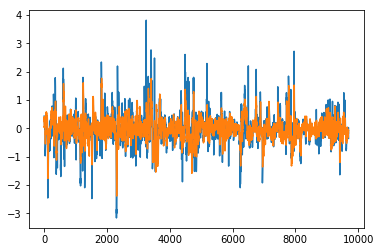

In [25]:
plt.plot(targs)
plt.plot(preds)

In [26]:
orig = dp.reform_data(rs, sc_df, scalers)

In [27]:
targ_df = pd.DataFrame({'close': targs.flatten()})
pred_df = pd.DataFrame({'close': preds.flatten()})

In [28]:
targ_df.shape

(9695, 1)

In [29]:
resc_targs = dp.reform_data(rs[-9695:], targ_df, scalers)
resc_preds = dp.reform_data(rs[-9695:], pred_df, scalers)

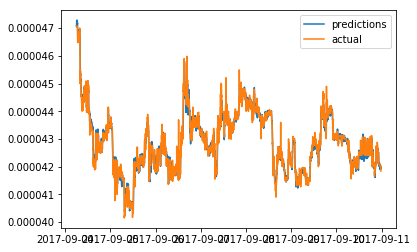

In [30]:
plt.plot(resc_preds, label='predictions')
plt.plot(rs['close'][-9695:], label='actual')
plt.legend()

In [31]:
data = [go.Scatter(x=rs[-9695:].index, y=resc_targs.close, name='actual'),
       go.Scatter(x=rs[-9695:].index, y=resc_preds.close, name='predictions')]
iplot(data)

In [32]:
diff = rs['close'][-9695:] - resc_preds['close'].values
diff_pct = (rs['close'][-9695:] - resc_preds['close'].values) / rs['close'][-9695:]

In [33]:
diff_pct.shape

(9695,)

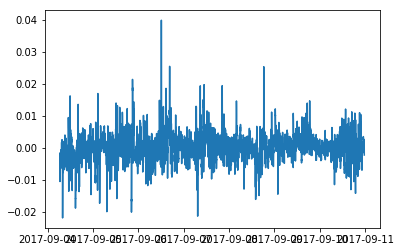

In [34]:
plt.plot(diff_pct[30:])

# ok, so it does pretty well predicting 5 timesteps ahead... how about something a bit further out, like 3 hours, or 180 timesteps?

In [35]:
start = time.time()
feats, targs = dp.create_hist_feats(sc_df.iloc[-10000:], future=180)
end = time.time()
print('took', str(int(end - start)), 'seconds')

took 5 seconds


In [36]:
train_feats = feats[:-1000]
train_targs = targs[:-1000]

In [37]:
epochs = 13

In [38]:
save_model_path = './simple_model'

sess = tf.Session()

# Initializing the variables
sess.run(tf.global_variables_initializer())
# IMPORTANT! only train on 90% of data
f_batches, t_batches = make_batches(train_feats, train_targs, batch_size)
# Training cycle
for epoch in range(epochs):
    # Loop over all batches
    for batch_features, batch_labels in zip(f_batches, t_batches):
        train_neural_network(sess, optimizer, keep_probability, batch_features, batch_labels)
    print('Epoch {:>2}:  '.format(epoch + 1), end='')
    print_stats(sess, batch_features, batch_labels, mse)

# Save Model
saver = tf.train.Saver()
save_path = saver.save(sess, save_model_path)

num_batches: 266
leftovers: 8
265
Epoch  1:  loss = 0.052245527505874634
Epoch  2:  loss = 0.049886755645275116
Epoch  3:  loss = 0.06374100595712662
Epoch  4:  loss = 0.04288119822740555
Epoch  5:  loss = 0.03669710457324982
Epoch  6:  loss = 0.040803734213113785
Epoch  7:  loss = 0.038238510489463806
Epoch  8:  loss = 0.028203096240758896
Epoch  9:  loss = 0.024974260479211807
Epoch 10:  loss = 0.027966680005192757
Epoch 11:  loss = 0.028599906712770462
Epoch 12:  loss = 0.04455513879656792
Epoch 13:  loss = 0.04299911856651306


In [39]:
preds = sess.run(pred, feed_dict={x: feats, y: targs, keep_prob: 1})

In [40]:
targ_df = pd.DataFrame({'close': targs.flatten()})
pred_df = pd.DataFrame({'close': preds.flatten()})

In [41]:
resc_targs = dp.reform_data(rs[-9520:], targ_df, scalers)
resc_preds = dp.reform_data(rs[-9520:], pred_df, scalers)

In [42]:
data = [go.Scatter(x=rs[-9520:].index, y=resc_targs.close, name='actual'),
       go.Scatter(x=rs[-9520:].index, y=resc_preds.close, name='predictions')]
iplot(data)

# test out future predictions

In [43]:
feats, targs = dp.create_feats_to_current(sc_df.iloc[-10000:-1000], future=180)

In [44]:
preds = sess.run(pred, feed_dict={x: feats, y: targs, keep_prob: 1})

In [45]:
preds.shape

(8700, 1)

In [46]:
targs.shape

(8520, 1)

In [47]:
feats.shape

(8700, 300, 5)

In [48]:
targ_df = pd.DataFrame({'close': targs.flatten()})
resc_targs = dp.reform_data(rs[-9520:-1000], targ_df, scalers)

In [49]:
future_preds = preds[8520:]

In [50]:
future_preds.shape

(180, 1)

In [51]:
resc_preds = dp.rescale_data(pd.DataFrame({'close': future_preds.flatten()}), scalers)

In [52]:
resc_preds.shape

(180, 1)

In [53]:
# this math kind of seems to work, although I think it's wrong

def reform_prediction(df, prediction, mva=30):
    """
    :param df: a pandas dataframe of the known data.  This should be the natural data,
                not scaled or normalized
    :param prediction: rescaled
    """
    return df.iloc[-mva + 1:].close.sum() / (mva - prediction)


def reform_future_predictions(df, preds, mva=30):
    """
    rescales future predictions
    :param df: pandas dataframe of current data, up to most recent timestep before future predictions
    :param preds: numpy array of predictions, with shape (x,)
    :param mva: integeter specifying moving average period (same as used for scaling the data)
    """
    resc_preds = [reform_prediction(df, preds[0], mva=mva)]
    for i in range(1, mva - 1):
        print(-mva + i + 1, i)
        cur = (df.iloc[-mva + i + 1:].close.sum() + sum(resc_preds[:i])) / (mva - preds[i])
        resc_preds.append(cur)

    for i in range(mva, preds.shape[0]):
        print(-mva + i, i)
        cur = sum(resc_preds[-mva + i:i]) / (mva - preds[i])
        resc_preds.append(cur)

    return pd.DataFrame({'close': resc_preds})

In [54]:
rs.close[-1032]

4.2549999999999997e-05

In [55]:
# first point
dp.reform_prediction(rs[:-1000], resc_preds.close[0], mva=30)

4.2308991423330465e-05

In [56]:
resc_preds.close[0]

0.99385524

In [57]:
ref_future_preds = dp.reform_future_predictions(rs[:-1000], resc_preds.close.values)

In [58]:
ref_future_preds.close[0]

4.2308991423330465e-05

In [59]:
ref_future_preds.shape

(180, 1)

In [60]:
past_preds = preds[:8520]

In [61]:
ref_past_preds = dp.reform_data(rs[-9520:-1000], pd.DataFrame({'close': past_preds.flatten()}), scalers)

In [62]:
start = ref_past_preds.index[-1] + timedelta(minutes=1)

In [63]:
start

Timestamp('2017-09-10 06:58:00', freq='T')

In [64]:
future_ix = pd.DatetimeIndex(start=start, end=start + timedelta(minutes=ref_future_preds.shape[0] - 1), freq='T')

In [65]:
future_ix.shape

(180,)

In [66]:
ref_future_preds.set_index(future_ix, inplace=True)

In [67]:
ref_future_preds.close[0]

4.2308991423330465e-05

In [68]:
data = [go.Scatter(x=rs[-9520:-1000].index, y=resc_targs.close, name='actual'),
        go.Scatter(x=rs[-9520:-1000].index, y=ref_past_preds.close, name='predictions'),
        go.Scatter(x=ref_future_preds.index, y=ref_future_preds.close, name='future predictions'),
        go.Scatter(x=rs[-1000:-1000+180].index, y=rs.close[-1000:-1000+180], name='actual future')]
iplot(data)

# loop through future predictions and score model

In [74]:
def pred_future_points(sc_df,
                       datapoints=10000,
                       teston=1000,
                       history=300,
                       future=180):
    feats, targs = dp.create_feats_to_current(sc_df.iloc[-datapoints:-teston], history=history, future=future)
    preds = sess.run(pred, feed_dict={x: feats, y: targs, keep_prob: 1})
    fut_idx = datapoints - teston - history - future
    past_preds = preds[:fut_idx]
    future_preds = preds[fut_idx:]
    
    targ_df = pd.DataFrame({'close': targs.flatten()})
    rs_idx = history + future - datapoints
    ref_targs = dp.reform_data(rs[rs_idx:-teston], targ_df, scalers)
    ref_past_preds = dp.reform_data(rs[rs_idx:-teston], pd.DataFrame({'close': past_preds.flatten()}), scalers)
    resc_preds = dp.rescale_data(pd.DataFrame({'close': future_preds.flatten()}), scalers)
    ref_future_preds = dp.reform_future_predictions(rs, resc_preds.close.values)
    
    # set index for future predictions
    start = ref_past_preds.index[-1] + timedelta(minutes=1)
    future_ix = pd.DatetimeIndex(start=start, end=start + timedelta(minutes=ref_future_preds.shape[0] - 1), freq='T')
    ref_future_preds.set_index(future_ix, inplace=True)
    
    last_pred = ref_future_preds.close[-1]
    
    return ref_targs, ref_past_preds, ref_future_preds

In [75]:
ref_targs2, ref_past_prefs2, ref_future_preds2 = pred_future_points(sc_df, datapoints=1000, teston=300)

In [77]:
# don't run this cell, it'll take a long time...inefficient way to do it
# last_preds = None
# future = 180
# test_size = 1000
# history = 300
# for i in range(test_size-future):
#     ref_targs2, ref_past_prefs2, ref_future_preds2 = pred_future_points(sc_df, datapoints=test_size + history + future + 1 - i, teston=test_size - i)
#     if last_preds is None:
#         last_preds = ref_future_preds2.iloc[-1:]
#     else:
#         last_preds = last_preds.append(ref_future_preds2.iloc[-1:])

In [78]:
teston = 10
start = -(teston + history + future)
feats, targs = dp.create_feats_to_current(sc_df.iloc[start:], history=history, future=future)

In [79]:
feats.shape

(190, 300, 5)

In [80]:
targs.shape

(10, 1)

In [81]:
start

-490

In [82]:
targs[0].reshape(-1, 1).shape

(1, 1)

In [83]:
last_preds = None

for i in range(teston):
    preds = sess.run(pred, feed_dict={x: feats[i:future + i], y: targs[i].reshape(-1, 1), keep_prob: 1})
    fut_idx = - teston - history - future
    future_preds = preds[fut_idx:]
    resc_preds = dp.rescale_data(pd.DataFrame({'close': future_preds.flatten()}), scalers)
    ref_future_preds = dp.reform_future_predictions(rs, resc_preds.close.values)
    start = ref_past_preds.index[-1] + timedelta(minutes=1)
    future_ix = pd.DatetimeIndex(start=start, end=start + timedelta(minutes=ref_future_preds.shape[0] - 1), freq='T')
    ref_future_preds.set_index(future_ix, inplace=True)
    
    last_pred = ref_future_preds.iloc[-1:]
    if last_preds is None:
        last_preds = last_pred
    else:
        last_preds = last_preds.append(last_pred)

In [84]:
last_preds.close.values

array([  4.08507461e-05,   4.08350854e-05,   4.08488973e-05,
         4.08783629e-05,   4.09061363e-05,   4.08779737e-05,
         4.08901929e-05,   4.09022125e-05,   4.09040927e-05,
         4.09237561e-05])

In [94]:
def pred_future_points_all(sc_df,
                       teston=30,
                       history=300,
                       future=180,
                       mva=30):
    """
    Predicts the future points one at a time in the 'teston' section.
    teston must be at least the size of the mva used to normalize, otherwise ref_targs comes back all na's
    """
    last_preds = None
    start = -(teston + history + future)
    feats, targs = dp.create_feats_to_current(sc_df.iloc[start:], history=history, future=future)
    targ_df = pd.DataFrame({'close': targs.flatten()})
    ref_targs = dp.reform_data(rs[-(teston + mva):], targ_df, scalers)
    for i in range(teston):
        preds = sess.run(pred, feed_dict={x: feats[i:future + i - teston], y: targs[i].reshape(-1, 1), keep_prob: 1})
        fut_idx = future - 1 - teston
        future_preds = preds[fut_idx:]
        resc_preds = dp.rescale_data(pd.DataFrame({'close': future_preds.flatten()}), scalers)
        ref_future_pred = dp.reform_prediction(rs, resc_preds.close.values)
        ref_future_pred = pd.DataFrame({'close': ref_future_pred})

        last_pred = ref_future_pred.iloc[-1:].close
        if last_preds is None:
            last_preds = last_pred
        else:
            last_preds = last_preds.append(last_pred)
    
    future_idx = sc_df.index[-teston:]
    last_preds = pd.DataFrame(last_preds)
    last_preds.set_index(future_idx, inplace=True)
    
    return ref_targs, last_preds

rft, rfp = pred_future_points_all(sc_df)

In [95]:
teston = 30

In [96]:
dp.reform_data(rs[-teston-30:], sc_df.iloc[-30:], scalers).close.values

array([  4.20433333e-05,   4.20416667e-05,   4.20400000e-05,
         4.20355556e-05,   4.20311111e-05,   4.20266667e-05,
         4.20222222e-05,   4.20177778e-05,   4.20133333e-05,
         4.20088889e-05,   4.20044444e-05,   4.20000000e-05,
         4.20033333e-05,   4.20066667e-05,   4.20100000e-05,
         4.20133333e-05,   4.20166667e-05,   4.20200000e-05,
         4.20233333e-05,   4.20266667e-05,   4.20300000e-05,
         4.20333333e-05,   4.20366667e-05,   4.20400000e-05,
         4.20400000e-05,   4.20400000e-05,   4.20400000e-05,
         4.20400000e-05,   4.19800000e-05,   4.18400000e-05])

In [97]:
rs.iloc[-30:].close.values

array([  4.20433333e-05,   4.20416667e-05,   4.20400000e-05,
         4.20355556e-05,   4.20311111e-05,   4.20266667e-05,
         4.20222222e-05,   4.20177778e-05,   4.20133333e-05,
         4.20088889e-05,   4.20044444e-05,   4.20000000e-05,
         4.20033333e-05,   4.20066667e-05,   4.20100000e-05,
         4.20133333e-05,   4.20166667e-05,   4.20200000e-05,
         4.20233333e-05,   4.20266667e-05,   4.20300000e-05,
         4.20333333e-05,   4.20366667e-05,   4.20400000e-05,
         4.20400000e-05,   4.20400000e-05,   4.20400000e-05,
         4.20400000e-05,   4.19800000e-05,   4.18400000e-05])

In [98]:
rft.close.values

array([  4.20433333e-05,   4.20416667e-05,   4.20400000e-05,
         4.20355556e-05,   4.20311111e-05,   4.20266667e-05,
         4.20222222e-05,   4.20177778e-05,   4.20133333e-05,
         4.20088889e-05,   4.20044444e-05,   4.20000000e-05,
         4.20033333e-05,   4.20066667e-05,   4.20100000e-05,
         4.20133333e-05,   4.20166667e-05,   4.20200000e-05,
         4.20233333e-05,   4.20266667e-05,   4.20300000e-05,
         4.20333333e-05,   4.20366667e-05,   4.20400000e-05,
         4.20400000e-05,   4.20400000e-05,   4.20400000e-05,
         4.20400000e-05,   4.19800000e-05,   4.18400000e-05])

In [99]:
rfp.close.values

array([  4.20856049e-05,   4.21179539e-05,   4.21400146e-05,
         4.21303776e-05,   4.21037657e-05,   4.20773649e-05,
         4.20023025e-05,   4.20307151e-05,   4.20197393e-05,
         4.19837743e-05,   4.19650860e-05,   4.19141106e-05,
         4.19672615e-05,   4.19804855e-05,   4.19440876e-05,
         4.19511744e-05,   4.19485004e-05,   4.18881427e-05,
         4.19537755e-05,   4.19837270e-05,   4.19305143e-05,
         4.19348762e-05,   4.19100215e-05,   4.19183743e-05,
         4.19893950e-05,   4.19676835e-05,   4.19834250e-05,
         4.19670105e-05,   4.19471908e-05,   4.19537428e-05], dtype=float32)

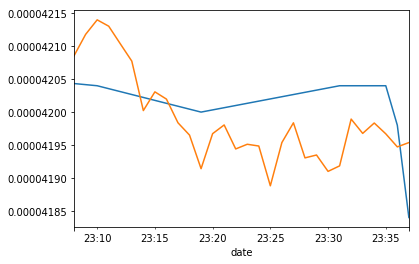

In [100]:
rft.close.plot()
rfp.close.plot()

In [101]:
def get_past_preds(sc_df,
                   past=1000,
                   teston=30,
                   history=300,
                   future=180):
    feats, targs = dp.create_hist_feats(sc_df.iloc[-past-teston:], history=history, future=future)
    preds = sess.run(pred, feed_dict={x: feats, y: targs, keep_prob: 1})
    targ_df = pd.DataFrame({'close': targs.flatten()})
    pred_df = pd.DataFrame({'close': preds.flatten()})
    start_idx = future + history - past - teston
    resc_targs = dp.reform_data(rs[start_idx:], targ_df, scalers)
    resc_preds = dp.reform_data(rs[start_idx:], pred_df, scalers)
    
    return resc_targs, resc_preds

In [102]:
rt, rp = get_past_preds(sc_df)

In [103]:
past = 1000
teston = 30
history = 300
future = 180
start_idx = history + future - past - teston
data = [go.Scatter(x=sc_df[start_idx:-teston].index, y=rt.close, name='actual'),
       go.Scatter(x=sc_df[start_idx:-teston].index, y=rp.close, name='predictions'),
       go.Scatter(x=sc_df[-teston:].index, y=rft.close, name='actual future'),
       go.Scatter(x=sc_df[-teston:].index, y=rfp.close, name='future predictions')]
iplot(data)

In [ ]:
def plot_future_preds_notebook():
    data = [go.Scatter(x=rs[-9520:-1000].index, y=resc_targs.close, name='actual'),
        go.Scatter(x=rs[-9520:-1000].index, y=ref_past_preds.close, name='predictions'),
        go.Scatter(x=ref_future_preds.index, y=ref_future_preds.close, name='future predictions'),
        go.Scatter(x=rs[-1000:-1000+180].index, y=rs.close[-1000:-1000+180], name='actual future')]
    iplot(data)